## Title
### STAT 301 - Final Project
By: Joyce Cao, Matthew Tam, Zaim Naqvi, Genevieve Hoang

### Introduction

> This is the introduction

**Question:**

With this dataset, a question we are interested in answer is:
>Which set of predictors, methods, and coefficients best predict Airbnb listing prices in Paris, Barcelona, and Vienna based on various characteristics of the Airbnb

We are interested in understanding how the combination of different listing characteristics and location-related factors can predict Airbnb pricing of future listings. Specifically, I will explore the physical characteristics of each Airbnb (e.g. room type, how many people it accommodates, the cleanliness rating, etc.) and the external factors (e.g. distance from metro or city center, the city it is in, the day of the week, etc.)

Thus, we define realSum as the response variable, and consider all other variables that show a significant relationship with it as explanatory variables.

---

### Method and Results

In [1]:
# Load Packages
library(tidyverse)
library(broom)
library(leaps)
library(MASS)
library(rsample)
library(dplyr)
library(readr)
library(corrplot)
library(ggplot2)
library(car)
library(glmnet)

set.seed(999)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘MASS’


The following object is masked from ‘package:dplyr’:

    select


corrplot 0.92 loaded

Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object is masked from ‘package:purrr’:

    some


Loading required package: Matrix


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack


Loaded glmnet 4

In [2]:
# Load Data 
airbnb <- read_csv('airbnb.csv')
head(airbnb)

Rows: 13058 Columns: 21
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (3): room_type, city, day_type
dbl (15): realSum, person_capacity, multi, biz, cleanliness_rating, guest_sa...
lgl  (3): room_shared, room_private, host_is_superhost

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,⋯,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,city,day_type
<dbl>,<chr>,<lgl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
474.3175,Entire home/apt,FALSE,FALSE,4,FALSE,0,1,10,91,⋯,1.111996,0.63049095,526.4694,17.94293,915.5871,20.15489,2.17556,41.39624,Barcelona,Weekday
169.8978,Private room,FALSE,TRUE,2,TRUE,1,0,10,88,⋯,1.751839,0.12401717,320.1275,10.91046,794.2774,17.48449,2.14906,41.38714,Barcelona,Weekday
161.9848,Private room,FALSE,TRUE,4,FALSE,0,1,9,88,⋯,1.670493,0.08032198,344.0739,11.72659,840.6736,18.50581,2.15357,41.37859,Barcelona,Weekday
367.9568,Entire home/apt,FALSE,FALSE,3,FALSE,0,1,10,91,⋯,1.475847,0.09310686,400.0574,13.63460,946.5899,20.83736,2.16839,41.37390,Barcelona,Weekday
196.8953,Private room,FALSE,TRUE,3,FALSE,1,0,9,91,⋯,1.855452,0.27248605,346.0422,11.79368,792.2960,17.44087,2.15238,41.37699,Barcelona,Weekday
330.9517,Entire home/apt,FALSE,FALSE,3,FALSE,0,1,9,100,⋯,2.565611,0.70129045,391.0874,13.32889,525.5139,11.56818,2.18197,41.40842,Barcelona,Weekday


**a.) Exploratory Data Analysis (EDA)**

In [3]:
# Main developer: Joyce 
#Check for na values in the data
sum(is.na(airbnb))

[1] 0

In [4]:
# Main developer: Joyce 
# Handle potential outliers in price (remove extreme values)
airbnb <- filter(airbnb, realSum > 0 & realSum < quantile(realSum, 0.99, na.rm = TRUE))
head(airbnb)

realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,⋯,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,city,day_type
<dbl>,<chr>,<lgl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
474.3175,Entire home/apt,FALSE,FALSE,4,FALSE,0,1,10,91,⋯,1.111996,0.63049095,526.4694,17.94293,915.5871,20.15489,2.17556,41.39624,Barcelona,Weekday
169.8978,Private room,FALSE,TRUE,2,TRUE,1,0,10,88,⋯,1.751839,0.12401717,320.1275,10.91046,794.2774,17.48449,2.14906,41.38714,Barcelona,Weekday
161.9848,Private room,FALSE,TRUE,4,FALSE,0,1,9,88,⋯,1.670493,0.08032198,344.0739,11.72659,840.6736,18.50581,2.15357,41.37859,Barcelona,Weekday
367.9568,Entire home/apt,FALSE,FALSE,3,FALSE,0,1,10,91,⋯,1.475847,0.09310686,400.0574,13.63460,946.5899,20.83736,2.16839,41.37390,Barcelona,Weekday
196.8953,Private room,FALSE,TRUE,3,FALSE,1,0,9,91,⋯,1.855452,0.27248605,346.0422,11.79368,792.2960,17.44087,2.15238,41.37699,Barcelona,Weekday
330.9517,Entire home/apt,FALSE,FALSE,3,FALSE,0,1,9,100,⋯,2.565611,0.70129045,391.0874,13.32889,525.5139,11.56818,2.18197,41.40842,Barcelona,Weekday


**Correlation With Price:**

To check which continuous variables have the highest correlation with price, I plotted a correlation heatmap. This heatmap is relevant to answer the question because it helps to quickly identify which numeric variables are associated with price, to what degree, and identify variables that likely won't help explain price. It also helps us spot potential multicollinearity issues.

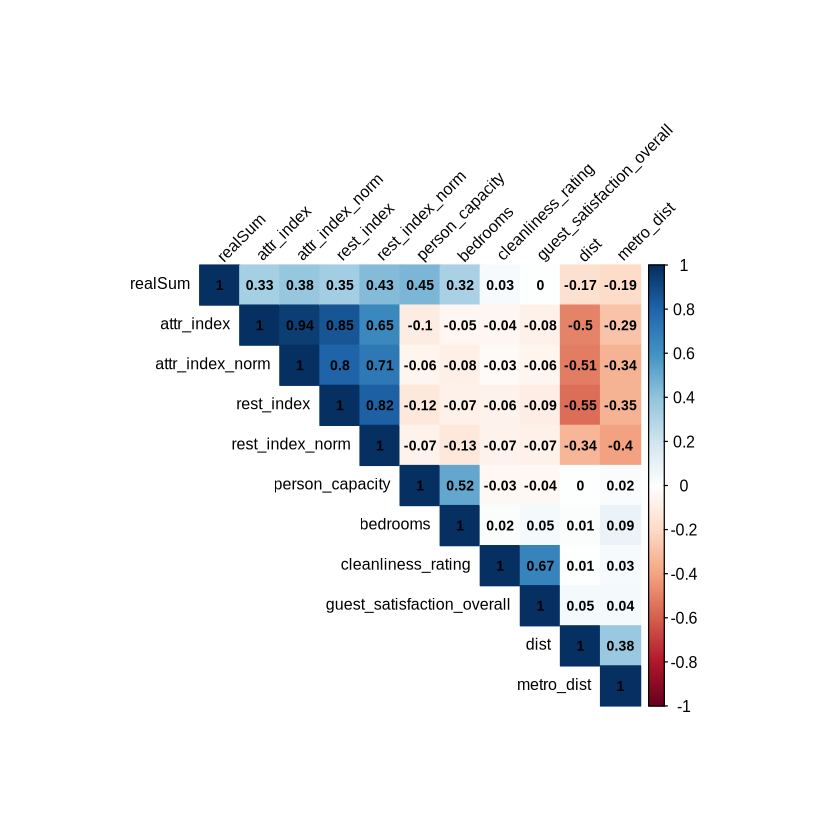

In [5]:
# Main developer: Joyce 
selected_cols <- c("realSum", "person_capacity", "bedrooms", "cleanliness_rating", 
                   "guest_satisfaction_overall", "dist", "metro_dist", "attr_index", "rest_index",
                   "attr_index_norm", "rest_index_norm")

correlation_data <- airbnb[, selected_cols]

cor_matrix <- cor(correlation_data)

corrplot(cor_matrix, 
         method = "color",   
         type = "upper",    
         order = "hclust",          
         tl.cex = 0.8,           
         tl.col = "black",    
         tl.srt = 45,              
         addCoef.col = "black",    
         number.cex = 0.7)

From these results, we observe that `rest_index_norm`, `person_capacity` and `attr_index_norm` have moderate postive correlation with the price of the Airbnb listing. The other variables don't have a significant correlation with realSum. There are also multicollinearity issues such as in `attr_index` and `rest_index` due to their high association with `attr_index_norm` and `rest_index_norm`. This is understandable as `attr_index_norm` and `rest_index_norm` are the normalized values of `attr_index` and `rest_index`. Moreover, `dist` also has a medium negative relationship with `attr_index_norm` and `rest_index_norm`, something we need to be aware of and address if necessary.

To further analyze the data, we can create boxplots of the Airbnb price vs categorical variables such as room type, city, superhost, day type, etc. These boxplots allow for visual comparison of the distributions including the median, spread, and outliers. This also helps with determining whether the categorical variable is likely to be a significant predictor, allowing visual assessment of group-level differences in price.


Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine




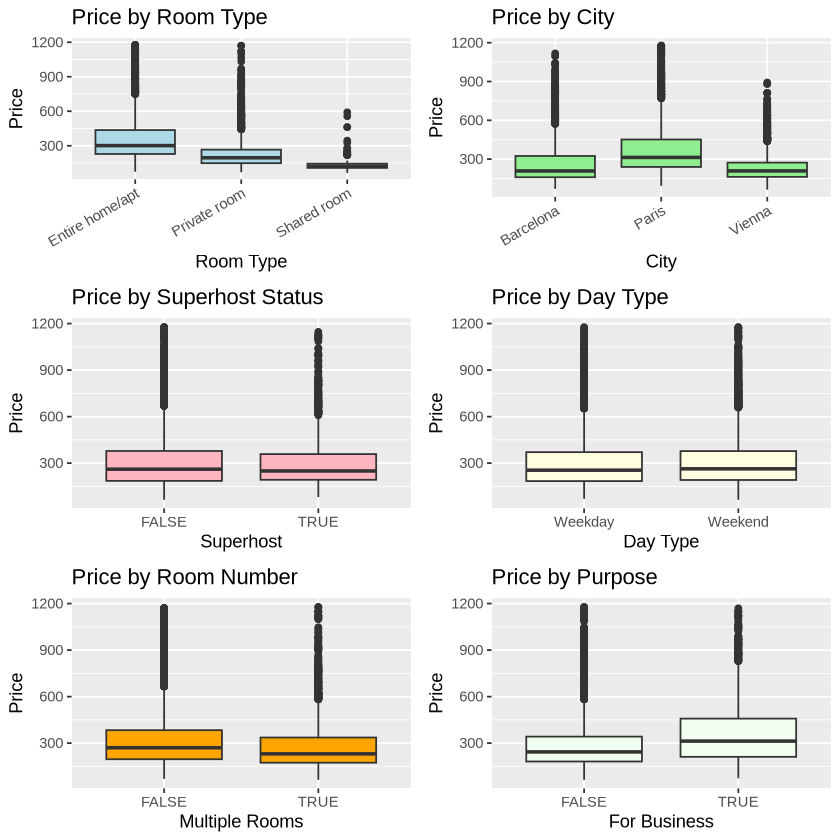

In [6]:
# Main developer: Joyce 
# Price vs Room Type
p1 <- ggplot(airbnb, aes(x = room_type, y = realSum)) +
    geom_boxplot(fill = "lightblue") +
    labs(title = "Price by Room Type", x = "Room Type", y = "Price") +
    theme(axis.text.x = element_text(angle = 30, hjust = 1))

# Price vs City
p2 <- ggplot(airbnb, aes(x = city, y = realSum)) +
    geom_boxplot(fill = "lightgreen") +
    labs(title = "Price by City", x = "City", y = "Price") +
    theme(axis.text.x = element_text(angle = 30, hjust = 1))

# Price vs Superhost
p3 <- ggplot(airbnb, aes(x = factor(host_is_superhost), y = realSum)) +
    geom_boxplot(fill = "lightpink") +
    labs(title = "Price by Superhost Status", x = "Superhost", y = "Price") 

# Price vs Day Type
p4 <- ggplot(airbnb, aes(x = day_type, y = realSum)) +
    geom_boxplot(fill = "lightyellow") +
    labs(title = "Price by Day Type", x = "Day Type", y = "Price")

# Price vs Number of Rooms
p5 <- ggplot(airbnb, aes(x = factor(multi), y = realSum)) +
    geom_boxplot(fill = "orange") +
    labs(title = "Price by Room Number", x = "Multiple Rooms", y = "Price") +
    scale_x_discrete(labels = c("0" = "FALSE", "1" = "TRUE"))

# Price vs Purpose 
p6 <- ggplot(airbnb, aes(x = factor(biz), y = realSum)) +
    geom_boxplot(fill = "honeydew") +
    labs(title = "Price by Purpose", x = "For Business", y = "Price") +
    scale_x_discrete(labels = c("0" = "FALSE", "1" = "TRUE"))


library(gridExtra)
grid.arrange(p1, p2, p3, p4, p5, p6, ncol = 2)

From these boxplots, we can observe that the room type significantly influence the Airbnb's listing price. For instance, Airbnb's that are entire homes/apartments tend to have higher price than private rooms and shared rooms, with shared rooms tending to be the cheapest. Thus, this variable is most likely to be a significant predictor, and likely useful to include in the model. Additionally, Paris listings have higher median prices compared to Barcelona and Vienna, suggesting that the city variable matters as well, and we can consider including this variable in our model. Finally, the listing price tends to be slightly higher for customers who book the Airbnb for business purposes. Therefore, business purpose might also impact pricing, and should be considered when building the model.

On the other hand, superhost status, day type, or whether the listing is for multiple rooms or not seem to not have a significant impact on pricing. On the other hand, their effects may be confounded with other variables which requires further investigating.

We removed the following variables from our dataset based on domain knowledge and statistical justification:
- `room_shared` and `room_private`: These were removed because the information is already captured by the room_type variable, which is more comprehensive.
- `attr_index` and `rest_index`: These were eliminated due to multicollinearity with their normalized versions (attr_index_norm, rest_index_norm), which we retained.
- `lng` and `lat`: We dropped these because location information is already summarized by the city variable
- `multi` and `biz`: Initially removed after we observed via boxplots that they had minimal variation in price.

In [7]:
# Main developer: Matthew
# Select Relevant Variables
airbnb_clean <- airbnb %>%
    dplyr::select(
        -room_shared,
        -room_private,
        -multi,
        -biz,
        -attr_index,
        -rest_index,
        -lng,
        -lat
    )
head(airbnb_clean)

realSum,room_type,person_capacity,host_is_superhost,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,attr_index_norm,rest_index_norm,city,day_type
<dbl>,<chr>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
474.3175,Entire home/apt,4,FALSE,10,91,1,1.111996,0.63049095,17.94293,20.15489,Barcelona,Weekday
169.8978,Private room,2,TRUE,10,88,1,1.751839,0.12401717,10.91046,17.48449,Barcelona,Weekday
161.9848,Private room,4,FALSE,9,88,1,1.670493,0.08032198,11.72659,18.50581,Barcelona,Weekday
367.9568,Entire home/apt,3,FALSE,10,91,1,1.475847,0.09310686,13.63460,20.83736,Barcelona,Weekday
196.8953,Private room,3,FALSE,9,91,1,1.855452,0.27248605,11.79368,17.44087,Barcelona,Weekday
330.9517,Entire home/apt,3,FALSE,9,100,2,2.565611,0.70129045,13.32889,11.56818,Barcelona,Weekday


**b.) Analysis Plan**

To answer our question, we will perform the following steps:
1. **Data Splitting**: We will begin by splitting the splitting the dataset into a training set (75%) and a testing set (25%) using `initial_split()` from the rsample package. All variable selection and model fitting will be conducted exclusively on the training set to avoid data leakage and ensure an unbiased estimate of the model's performance
2. **Variable Selection**: To identify the most relevant predictors of Airbnb listing prices, we will apply LASSO regression via `cv.glmnet` which applies an L1 penalty to shrink less important coefficients to zero. This approach is more robust than traditional stepwsie selection, and helps prevent overfitting. The optimal value of the regularization parameter $\lambda$ was chosen using cross-validation, ensuring that the chosen model generalizes well to new data by minimizing prediction error on unseen subsets of training data.
3. **Model Evaluation**: Once the final model is selected, we will evaluate its predictive performance using the testing set. Since our response variable `realSum` is continuous, we will use the RMSE to measure the average magnitude of the prediction errors and the R-squared metric to quantify the proportion of variance in listing prices that is explinated by the model on unseen data. We will use the `predict()` function to generate prediction on the test data.
4. **Model Diagnostic Checks**: Before finalizing the model, we will perform a series of diagnostic checks to ensure key assumptions of linear regression are not violated, including:
   - Assessing linearity and homoscedasticity using residual plots
   - Evalute normality of residuals using QQ-plots
   - Check multicolinearity among predictors using `vif()`

**c.) Results**

**Data Splitting**

In [8]:
# Main developer: Matthew
# Train/Test Split
split_data <- initial_split(airbnb_clean, prop = 0.75)

train <- training(split_data)
test <- testing(split_data)

**Variable Selection**

In [16]:
# Main developer: Joyce

# Lasso Regression
lasso_model <- cv.glmnet(model.matrix(realSum ~ . - 1, data = train),
                         y = train$realSum,
                         alpha = 1
    
)
lasso_model


Call:  cv.glmnet(x = model.matrix(realSum ~ . - 1, data = train), y = train$realSum,      alpha = 1) 

Measure: Mean-Squared Error 

    Lambda Index Measure    SE Nonzero
min  0.158    68   15883 372.2      14
1se  7.182    27   16245 379.3       9

In [17]:
# Main developer: Joyce

# Chosen Lasso Coefficients
beta_lasso <- coef(lasso_model, s = "lambda.min")


lasso_selected_covariates <- as_tibble(
        as.matrix(beta_lasso),
        rownames='covariate') %>%
        filter(covariate != '(Intercept)' & abs(s1) !=0) %>% 
        pull(covariate)

cat(paste0("- ", lasso_selected_covariates), sep = "\n")

- room_typeEntire home/apt
- room_typeShared room
- person_capacity
- host_is_superhostTRUE
- cleanliness_rating
- guest_satisfaction_overall
- bedrooms
- dist
- metro_dist
- attr_index_norm
- rest_index_norm
- cityParis
- cityVienna
- day_typeWeekend


In [34]:
# Main developer: Joyce

# To keep the reference levels of dummy variables consistent through lasso and lm
train$room_type <- relevel(factor(train$room_type), ref = "Private room")

# Selected linear model
airbnb_mlr_predictor <- lm(realSum ~ ., data = train)

tidy(airbnb_mlr_predictor)

term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),-168.3795839,16.4242019,-10.2519188,1.548342e-24
room_typeEntire home/apt,75.1173344,3.4747277,21.6181931,2.931882e-101
room_typeShared room,-136.6339685,13.6077044,-10.0409271,1.313992e-23
person_capacity,47.0963604,1.4031073,33.5657578,9.321069e-234
host_is_superhostTRUE,9.3314814,3.4330107,2.7181626,6.576245e-03
cleanliness_rating,14.3702282,1.8111382,7.9343633,2.350330e-15
guest_satisfaction_overall,-0.1991539,0.2065620,-0.9641366,3.350015e-01
bedrooms,59.5134793,2.6205998,22.7098692,2.795740e-111
dist,3.5332534,1.1676387,3.0259817,2.484784e-03


**Model Evaluation**

In [39]:
# Main Developer: Joyce

evaluate_model <- function(observed, predicted) {
  residuals <- observed - predicted
  
  metrics <- list(
    RMSE = sqrt(mean(residuals^2)),
    MAE = mean(abs(residuals)),
    R_squared = 1 - sum(residuals^2) / sum((observed - mean(observed))^2)
  )
  
  return(metrics)
}

# Compute RMSE
test_predictions <- predict(airbnb_mlr_predictor, newdata = test)

model_performance <- evaluate_model(test$realSum, test_predictions)

model_performance

$RMSE
[1] 122.0302

$MAE
[1] 87.58251

$R_squared
[1] 0.5224869

The model achieved a RMSE of approximately 122.03, a MAE of 87.58, and a test R-squared of 0.522. 

- The RMSE of 122.03 indicates that, on average, the model's predicted listing prices differ from the actual prices by about 122 euros, with larger errors being penalized more heavily due to the squaring of residuals.
- The MAE of 87.58 provides a more straighforward measure, indicating that, on average, the model's predictions are off by about 88 euros. We believe this is within a reasonable range given the variability in Airbnb prices.
- The R-squared value of 0.522 means that about 52.2% of the variation in Airbnb listing prices in the test set is explained by our model, suggesting that a meaningful portion of the data is captured by the model, though there is still room for improvement.

Overall, our model shows moderate predictive accuracy, and could be potentially further improved (discussed further in the dicussion)

**Model Diagnositic Check**

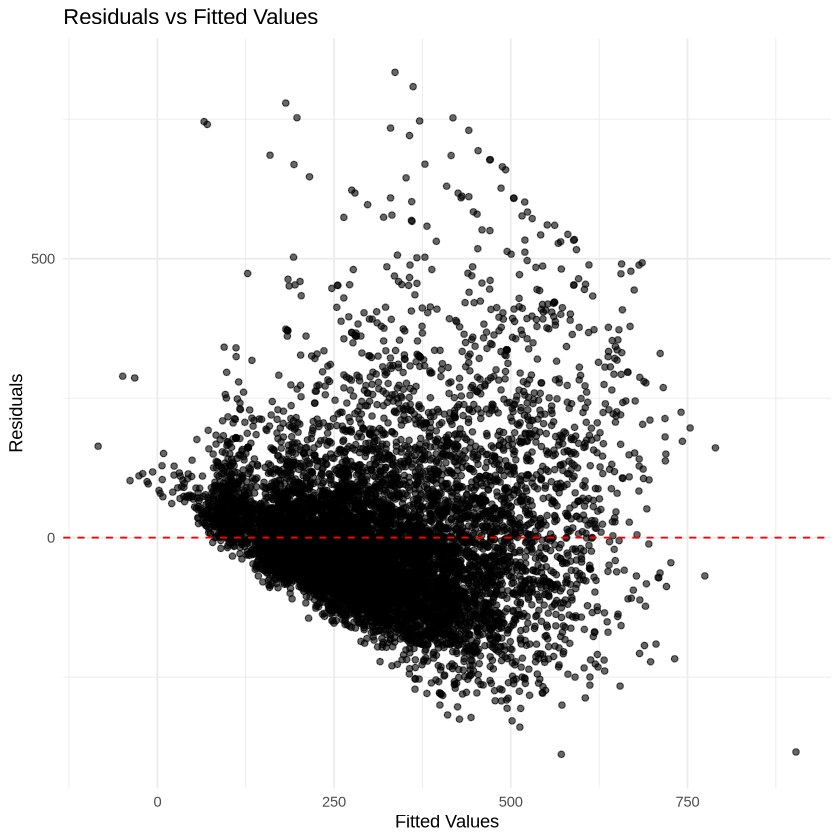

In [41]:
# Main Developer: Joyce

# Residuals vs Fitted Values
diagnostics <- augment(airbnb_mlr_predictor)

ggplot(diagnostics, aes(.fitted, .resid)) +
  geom_point(alpha = 0.6) +
  geom_hline(yintercept = 0, linetype = "dashed", color = "red") +
  labs(title = "Residuals vs Fitted Values",
       x = "Fitted Values",
       y = "Residuals") +
  theme_minimal()

The residuals vs fitted values plot shows that the residuals are generally centered around zero, however, there is a clear funnel-shaped pattern (spread of residuals increase with fitted values). This indicates a violation of the constant variance (homoscedasticity) assumption. Thus, this model tends to be more variable and less accurate for higher-priced listings. This could be addressed in future work by transforming the response variable (log transformation).

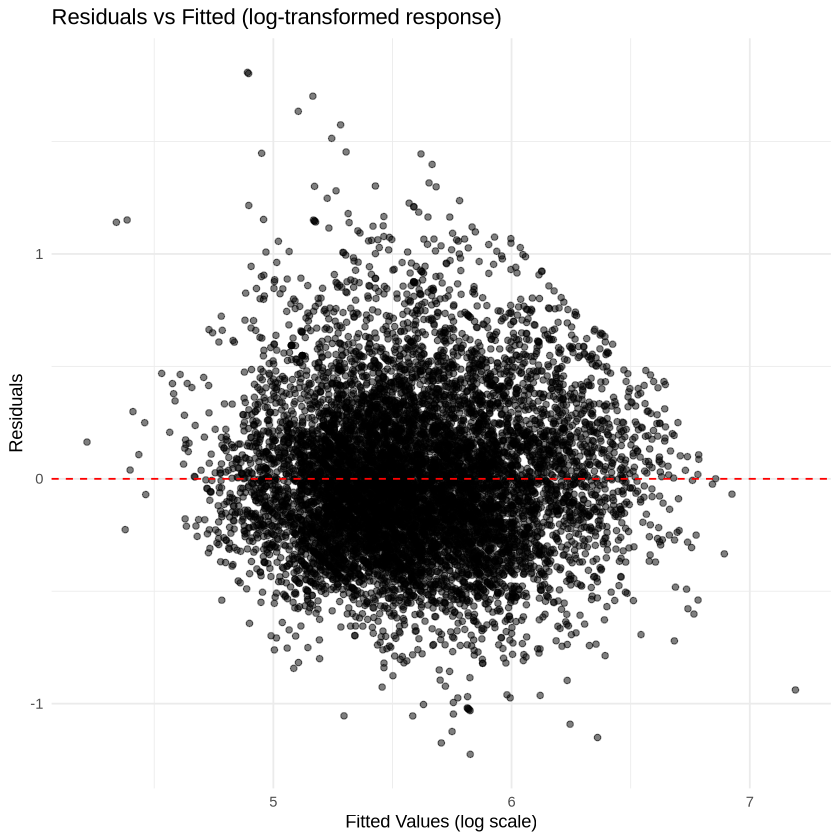

In [42]:
# Main developer: Joyce
airbnb_log_model <- lm(
  log(realSum) ~ 
    room_type + 
    person_capacity + 
    cleanliness_rating + 
    bedrooms + 
    dist +
    metro_dist + 
    attr_index_norm + 
    rest_index_norm + 
    city + 
    day_type, 
  data = train
)

diagnostics_log <- augment(airbnb_log_model)

# Plot Residuals vs Fitted
library(ggplot2)
ggplot(diagnostics_log, aes(.fitted, .resid)) +
  geom_point(alpha = 0.5) +
  geom_hline(yintercept = 0, linetype = "dashed", color = "red") +
  labs(title = "Residuals vs Fitted (log-transformed response)",
       x = "Fitted Values (log scale)",
       y = "Residuals") +
  theme_minimal()

The log transformation of the response variable improved the model assumptions and addressed the heteroscedasticity issue. However, transforming the response changes the interpretation of the model and can introduce bias when exponentiating the predictions to the original scale. To maintain interpretability and direct prediction of the response, we chose to continue with the original model for prediction. Future studies focusing on improving model validity should address this violation through transformations or other modeling techniques.

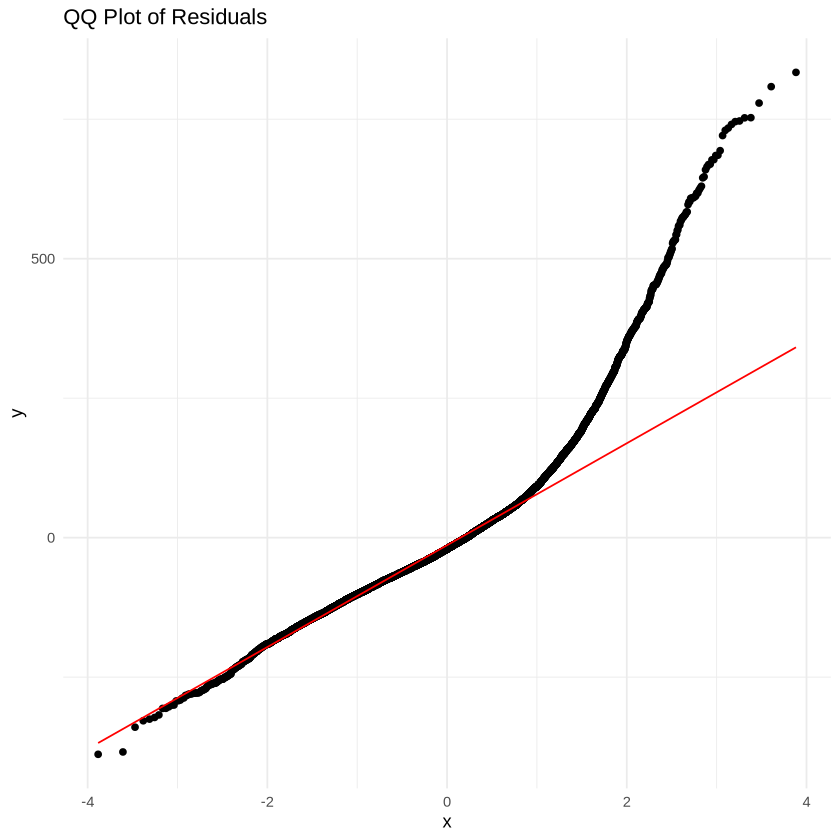

In [43]:
# Main Developer: Joyce
# QQ plot
ggplot(diagnostics, aes(sample = .resid)) +
  stat_qq() +
  stat_qq_line(color = "red") +
  labs(title = "QQ Plot of Residuals") +
  theme_minimal()

There seems to be some right skewness in the residuals, however, since our sample size is large, we can proceed with the current model while acknowledging that prediction intervals may be less accurate due to the heavy tails. The point estimates and overall model performance should remain reliable.

In [44]:
# Main Developer: Joyce
vif(airbnb_mlr_predictor)

,GVIF,Df,GVIF^(1/(2*Df))
room_type,1.693892,2,1.140831
person_capacity,1.837741,1,1.355633
host_is_superhost,1.099032,1,1.048347
cleanliness_rating,1.831900,1,1.353477
guest_satisfaction_overall,1.857279,1,1.362820
bedrooms,1.515695,1,1.231136
dist,2.217698,1,1.489194
metro_dist,1.519997,1,1.232882
attr_index_norm,2.838302,1,1.684726
rest_index_norm,7.889504,1,2.808826


Most predictors had low VIF values (below 5), indicating minimal multicollinearity. Two predictors — `rest_index_norm` and `city` — had moderately high VIFs (around 8), suggesting some multicollinearity. However, since the goal of this analysis is prediction rather than inference, and the predictive performance was not negatively affected, all variables were retained in the final model.

---

### Discussion

> this is the discussion

---

### Conclusion

> this is the conclusion

---

### References

1. Reference 1
2. Reference 2